In [1]:
from google.colab import drive
import folium
from folium.plugins import HeatMap
import pandas as pd
drive.mount('/content/drive')

ValueError: mount failed

In [ ]:


pip install fastparquet

In [ ]:
df = pd.read_parquet("/content/drive/Shared drives/Time Series/divvy_data/prod/divvy_data_expanded.parquet")

# ✅ Ensure 'date' is in datetime format
df["date"] = pd.to_datetime(df["date"])

In [ ]:
df["month"] = df["date"].dt.month
df["dayofweek"] = df["date"].dt.dayofweek
df["year"] = df["date"].dt.year

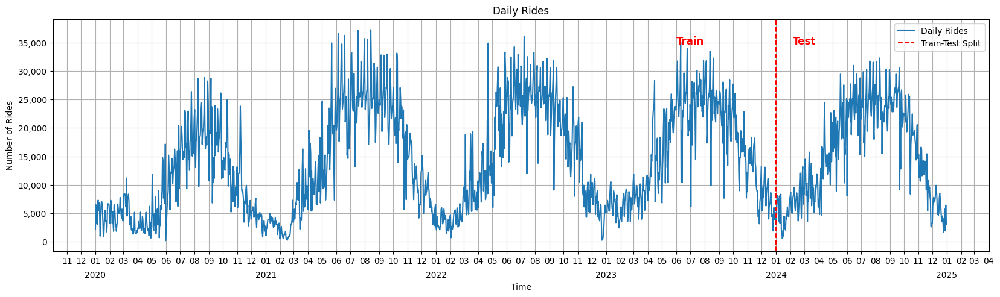

In [ ]:
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import pandas as pd

# Aggregate rides by date
rides_by_date_n = df.groupby(["date", "month", "dayofweek", "year"])["rides"].sum().reset_index()
time_data = rides_by_date_n['date']
plot_data = rides_by_date_n['rides']

# Define training end date
train_end_date = pd.to_datetime('2024-01-01')

# Create figure and axis
fig, ax = plt.subplots(figsize=(20, 5))

# Plot the data
ax.plot(time_data, plot_data, label="Daily Rides")

# Add vertical line to mark train-test split
ax.axvline(train_end_date, color='red', linestyle='--', label="Train-Test Split")

# Add text labels for Train and Test periods
ax.text(pd.to_datetime('2023-07-01'), ax.get_ylim()[1] * 0.9, 'Train',
        color='red', ha='center', va='center', fontsize=12, fontweight='bold')

ax.text(pd.to_datetime('2024-03-01'), ax.get_ylim()[1] * 0.9, 'Test',
        color='red', ha='center', va='center', fontsize=12, fontweight='bold')

# Format x-axis: Months as primary, Years as secondary
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m'))

sec_ax = ax.secondary_xaxis("bottom")
sec_ax.xaxis.set_major_locator(mdates.YearLocator())
sec_ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
sec_ax.tick_params(axis='x', which='major', pad=20)
sec_ax.set_xlabel('Time')

# Format y-axis labels with commas
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: f"{int(x):,}"))

# Labels and title
ax.set_ylabel('Number of Rides')
ax.set_title("Daily Rides")

# Add grid and show plot
ax.grid(True)
plt.legend()
plt.show()


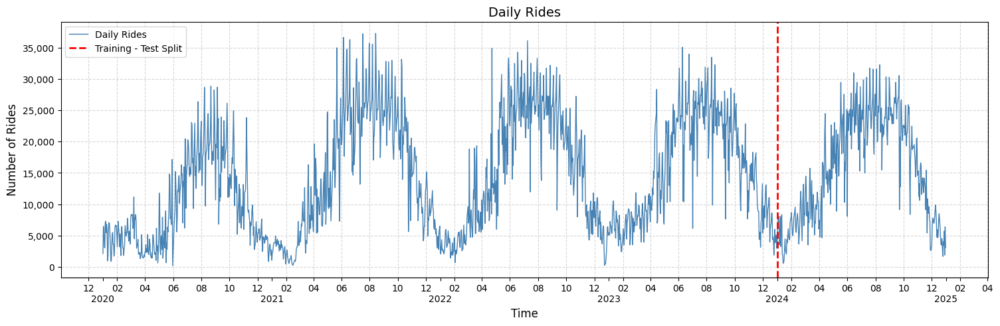

In [ ]:
# Define train-test split date
train_end_date = pd.to_datetime('2024-01-01')

# Create figure and axis
fig, ax = plt.subplots(figsize=(18, 5))

# Plot the data
ax.plot(time_data, plot_data, label="Daily Rides", color='steelblue', linewidth=1)

# Add vertical line for train-test split
ax.axvline(train_end_date, color='red', linestyle='--', linewidth=2, label="Training - Test Split")

# Format x-axis with months as primary locator
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m'))

# Add a secondary x-axis for years
sec_ax = ax.secondary_xaxis("bottom")
sec_ax.xaxis.set_major_locator(mdates.YearLocator())
sec_ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
sec_ax.tick_params(axis='x', which='major', pad=15)
sec_ax.set_xlabel('Time', fontsize=12)

# Format y-axis labels with commas
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: f"{int(x):,}"))

# Labels and title
ax.set_ylabel('Number of Rides', fontsize=12)
ax.set_title("Daily Rides", fontsize=14)

# Improve grid visibility
ax.grid(True, linestyle='--', alpha=0.5)

# Adjust legend placement
ax.legend(loc='upper left', fontsize=10)

# Show the plot
plt.show()


In [ ]:


# ✅ Filter for January 2024 (Note: Adjust filtering logic)
df_jan_2024 = df[(df["date"] >= pd.Timestamp("2024-05-01")) & (df["date"] <= pd.Timestamp("2024-05-31"))]

# ✅ Drop Rows with NaN in Required Columns
df_jan_2024 = df_jan_2024.dropna(subset=["start_lat", "start_lng", "rides"])

# ✅ Ensure Numeric Data Types for Critical Columns
df_jan_2024["rides"] = pd.to_numeric(df_jan_2024["rides"], errors="coerce")
df_jan_2024["start_lat"] = pd.to_numeric(df_jan_2024["start_lat"], errors="coerce")
df_jan_2024["start_lng"] = pd.to_numeric(df_jan_2024["start_lng"], errors="coerce")

# ✅ Filter Required Columns for Mapping
heatmap_data = df_jan_2024[["start_lat", "start_lng", "rides"]]

# ✅ Normalize Ride Counts for Better Heatmap Scaling
heatmap_data["rides"] = heatmap_data["rides"] / heatmap_data["rides"].max()

# ✅ Create a Folium Map Centered at the Mean of Ride Locations
map_center = [heatmap_data["start_lat"].mean(), heatmap_data["start_lng"].mean()]
m = folium.Map(location=map_center, zoom_start=12)

# ✅ Add HeatMap Layer
heat_data = list(zip(heatmap_data["start_lat"], heatmap_data["start_lng"], heatmap_data["rides"]))
HeatMap(heat_data, radius=10, max_zoom=13).add_to(m)

# ✅ Display Map
m


<ipython-input-3-7ebf314a8a40>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  heatmap_data["rides"] = heatmap_data["rides"] / heatmap_data["rides"].max()


In [ ]:
popular_routes = (
    df_jan_2024.groupby(["start_station_id", "end_station_id", "start_lat", "start_lng", "end_lat", "end_lng"])
    .agg({"rides": "sum"})
    .reset_index()
    .sort_values(by="rides", ascending=False)
    .head(20)  # Top 10 routes
)

# ✅ Create Folium Map
map_center = [df_jan_2024["start_lat"].mean(), df_jan_2024["start_lng"].mean()]
m = folium.Map(location=map_center, zoom_start=12)

# ✅ Add Polylines for the Top 10 Routes
for _, row in popular_routes.iterrows():
    folium.PolyLine(
        locations=[
            [row["start_lat"], row["start_lng"]],  # Starting point
            [row["end_lat"], row["end_lng"]]       # Ending point
        ],
        color="blue",
        weight=5,
        opacity=0.7,
        tooltip=f"Rides: {int(row['rides'])}"  # Display number of rides
    ).add_to(m)

# ✅ Add Title
title_html = '''
    <h3 align="center" style="font-size:20px">
        Top 10 Most Popular Routes (January 2024)
    </h3>
'''
m.get_root().html.add_child(folium.Element(title_html))

# ✅ Display Map
m


In [ ]:
from keplergl import KeplerGl

# Create Kepler map
map_1 = KeplerGl(height=600)
map_1.add_data(data=popular_routes, name="Top 10 Routes")
map_1.show()

ModuleNotFoundError: No module named 'keplergl'

In [ ]:
df.head()

,rideable_type,date,start_station_name,end_station_name,start_station_id,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,rides
0,classic_bike,2020-12-02,900 W Harrison St,Wolcott Ave & Polk St,13028,TA1309000064,41.874754,-87.649807,41.871262,-87.673688,member,1
1,classic_bike,2020-12-02,Aberdeen St & Jackson Blvd,Clinton St & Roosevelt Rd,13157,WL-008,41.877726,-87.654787,41.867118,-87.641088,member,1
2,classic_bike,2020-12-02,Albany Ave & Montrose Ave,Kedzie Ave & Milwaukee Ave,15621,13085,41.961041,-87.705866,41.929567,-87.707857,member,1
3,classic_bike,2020-12-02,Ashland Ave & 13th St,Blue Island Ave & 18th St,13354,13135,41.865234,-87.666507,41.857556,-87.661535,member,1
4,classic_bike,2020-12-02,Ashland Ave & Augusta Blvd,Ashland Ave & Augusta Blvd,13248,13248,41.899643,-87.667700,41.899643,-87.667700,casual,1


In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

Support for third party widgets will remain active for the duration of the session. To disable support:

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()